<a href="https://colab.research.google.com/github/bankijey/IBM-DS-Capstone-Project/blob/main/Airbnb_berlin.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Searching for the right Airbnb listing

Sharing economy is currently a major global trend. One popular example of sharing economy is Airbnb, which offers apartment owners an opportuinity to make quick cashflows from their properties and visitors a competitive alternative to hotels.

Currently due to travel restrictions, a lot of tourists cannot wait for the times when they can freely plan their holidays. With that in mind, I decided to explore one of the most trending topics in tourism. Airbnb

In this notebook, we examine Airbnb listings in Berlin and using clustering algorithims, we cluster listings based on prices, popularity and popular locations around them.

In [86]:
%load_ext google.colab.data_table

In [53]:
%unload_ext google.colab.data_table

## Import packages

 Along with the common data analysis packages, some necessary packages for this project are imported. These includes the Geopandas libraries for managing geographic data, geopy for coordinates and Folium for interactive maps.

In [2]:
import numpy as np 
import pandas as pd # library for data analsysis
import json # library to handle JSON files
import io
# Geographical libraries
try:
    import geopy
    from geopy.geocoders import Nominatim  # convert an address into latitude and longitude values
except:
    !conda install -c conda-forge geopy --yes
    import geopy
    from geopy.geocoders import Nominatim


geopy.geocoders.options.default_user_agent = 'my_app/banki'
geopy.geocoders.options.default_timeout = 7
from geopy.extra.rate_limiter import RateLimiter

try:
  import geopandas as gpd
except:
  !pip install geopandas
  import geopandas as gpd

from shapely.geometry import Point, Polygon

# Web Scraping
import requests # library to handle requests
from bs4 import BeautifulSoup # this module helps in web scrapping.
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import folium # map rendering library
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
import seaborn as sns # for statistical analysis
%matplotlib inline

# Import Clustering algorithms
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN

print('Package load: Successful')

     |████████████████████████████████| 1.0MB 12.3MB/s 
     |████████████████████████████████| 14.8MB 321kB/s 
     |████████████████████████████████| 6.5MB 66.1MB/s 
Package load: Successful


A function to get the cordinates of a passed location is created. This would be used throughout this notebook

In [3]:
def getCoord(address):
    
    '''Collect an address and define an agent
    Return the longitude and latitute'''
    try:
      geolocator = Nominatim()
      location = geolocator.geocode(address)
      return location.latitude,  location.longitude
    except:
      return None

Next, we define the authentication data that would be used to access the Foursquare API for searching locations

## AIRBNB Listings Data
Luckyily, detailed data on Airbnb listings are available from the [Inside Airbnb](http://insideairbnb.com/get-the-data.html) website. The first step is to download the data for the listings.

#### Download Listings


The csv file of the Airbnb listings in berlin is downloaded using the pandas read_csv method.

In [5]:
url="http://data.insideairbnb.com/germany/be/berlin/2021-02-20/data/listings.csv.gz"
listings = pd.read_csv(url)
listings_S = pd.read_csv('http://data.insideairbnb.com/germany/be/berlin/2021-02-20/visualisations/listings.csv')
listings['price'] = listings_S.price

In [94]:
listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19978 entries, 0 to 19977
Data columns (total 74 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            19978 non-null  int64  
 1   listing_url                                   19978 non-null  object 
 2   scrape_id                                     19978 non-null  int64  
 3   last_scraped                                  19978 non-null  object 
 4   name                                          19946 non-null  object 
 5   description                                   19413 non-null  object 
 6   neighborhood_overview                         10752 non-null  object 
 7   picture_url                                   19978 non-null  object 
 8   host_id                                       19978 non-null  int64  
 9   host_url                                      19978 non-null 

Looks good. Next, we select only necessary columns. These include information on location and some details that are usually important while searching for accomodation. The cost of course along with the popularity (measured with the number of reviews) and the minimum number of nights.

After that, the column types are converted automatically using the pandas `convert_dtypes()` method

In [6]:
slct_columns = ['id','host_is_superhost', 'neighbourhood_cleansed', 'neighbourhood_group_cleansed',
 'latitude','longitude', 'room_type', 'accommodates', 'bedrooms', 'beds', 'price',
'minimum_minimum_nights', 'last_review','number_of_reviews', 'reviews_per_month', 'review_scores_rating','instant_bookable']

# drop irrevant columns
data = listings[slct_columns]
# drop Nan values
data.dropna(inplace= True)
# Drop rows with last reviews before 2019 and mimium nights more than 10.
data = data[(data['last_review'] >= '2018-01-01') & (data['minimum_minimum_nights'] < 14)].reset_index(drop = True)
# Rename columns to be convienient
data.columns = ['id', 'superhost', 'neighbourhood',
       'district', 'latitude', 'longitude', 'type',
       'accommodates', 'bedrooms', 'beds', 'price', 'minimum_nights',
       'last_review', 'number_of_reviews', 'reviews_per_month',
       'review_scores_rating', 'instant_bookable']
# Convert datatypes
data = data.convert_dtypes()
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10839 entries, 0 to 10838
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    10839 non-null  Int64  
 1   superhost             10839 non-null  string 
 2   neighbourhood         10839 non-null  string 
 3   district              10839 non-null  string 
 4   latitude              10839 non-null  float64
 5   longitude             10839 non-null  float64
 6   type                  10839 non-null  string 
 7   accommodates          10839 non-null  Int64  
 8   bedrooms              10839 non-null  Int64  
 9   beds                  10839 non-null  Int64  
 10  price                 10839 non-null  Int64  
 11  minimum_nights        10839 non-null  Int64  
 12  last_review           10839 non-null  string 
 13  number_of_reviews     10839 non-null  Int64  
 14  reviews_per_month     10839 non-null  float64
 15  review_scores_ratin

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


## ! Get Nearby venues of AirBnB listings

Now we have our datasets of listings in Berlin, we now utilize the Fourquare API to get the type of venues around our listings. Using this information, we can easily narrow down our search to areas with certain venues present

In [7]:
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [8]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):

  ''' Takes in a dataframe of coordinates and entities within a specified radius
      returns the names, categories and coordinates of venues around the location'''

  venues_list=[]
  for name, lat, lng in zip(names, latitudes, longitudes):
#         print(name)
      
      # create the API request URL
      url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
          CLIENT_ID, 
          CLIENT_SECRET, 
          VERSION, 
          lat, 
          lng, 
          radius, 
          LIMIT)
          
      # make the GET request
      try:
        results = requests.get(url).json()["response"]['groups'][0]['items']
        # print('{} | Status code: {} | Radius: {}'.format(name, results['response']['suggestedRadius']))

        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])
      except:
        None
      
  nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
  nearby_venues.columns = ['Neighbourhood', 
                'Neighbourhood Latitude', 
                'Neighbourhood Longitude', 
                'Venue', 
                'Venue Latitude', 
                'Venue Longitude', 
                'Venue Category']
  
  return(nearby_venues)

In [9]:
# LIMIT = 100
# AB_venues = getNearbyVenues(names=data['id'],
#                                    latitudes=data['latitude'],
#                                    longitudes=data['longitude'],radius=500
#                                   )

AB_venues = pd.read_csv('AB_venues.csv')
AB_venues.drop(labels = 'Unnamed: 0', axis = 1, inplace=True)
AB_venues.rename(columns= {'Neighbourhood':'id'}, inplace=True)
AB_venues.sample(10)

,id,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
36600,2521868,52.48180,13.43828,Babbo Bar,52.481696,13.436558,Italian Restaurant
65524,5751563,52.52082,13.45216,Langosch,52.521979,13.449657,Modern European Restaurant
234348,22991038,52.52451,13.38422,Alnatura,52.528487,13.386047,Organic Grocery
28002,1565012,52.51756,13.42441,TanzSuite PanoramaLounge,52.519202,13.427023,Dance Studio
42234,3108686,52.50985,13.44612,FitX,52.505898,13.445891,Gym / Fitness Center
215951,21662937,52.55209,13.38154,La Femme,52.550107,13.385304,Breakfast Spot
68870,6110762,52.51697,13.42654,BoConcept,52.518643,13.426828,Furniture / Home Store
83176,8023750,52.50618,13.32538,Restaurant Cafe Bleibtreu,52.504021,13.319757,German Restaurant
200308,20614357,52.50012,13.31804,Aux Merveilleux de Fred,52.499290,13.313169,Pastry Shop
173231,18533334,52.53009,13.40251,Goldacker,52.531650,13.396327,Chocolate Shop


## Exploration

### Exploratory analysis
First, we use the `pd.describe()` method to summarise the distribution of the listings price, number of reviews per month and minimum nights. 


In [10]:
data.describe().drop(columns = ['id',  'latitude', 'longitude'])

,accommodates,bedrooms,beds,price,minimum_nights,number_of_reviews,reviews_per_month,review_scores_rating
count,10839.000000,10839.000000,10839.000000,10839.000000,10839.000000,10839.000000,10839.000000,10839.000000
mean,2.949903,1.297906,1.758834,71.755328,2.844358,34.022604,0.844304,94.984962
std,1.836051,0.668889,1.432481,80.672053,1.943197,57.570938,1.175138,7.450325
min,1.000000,1.000000,0.000000,9.000000,1.000000,1.000000,0.020000,20.000000
25%,2.000000,1.000000,1.000000,35.000000,2.000000,4.000000,0.170000,93.000000
50%,2.000000,1.000000,1.000000,53.000000,2.000000,11.000000,0.400000,97.000000
75%,4.000000,1.000000,2.000000,81.000000,3.000000,36.000000,1.030000,100.000000
max,16.000000,12.000000,17.000000,2291.000000,13.000000,618.000000,24.550000,100.000000


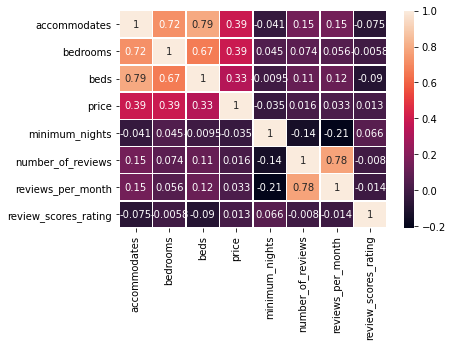

In [11]:
# Pearson correlation plotted with seaborn
sns.heatmap(data.drop(columns=['id', 'longitude', 'latitude']).corr(), annot=True, linewidths=.5)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7ff1afc3a790>,
      dtype=object)

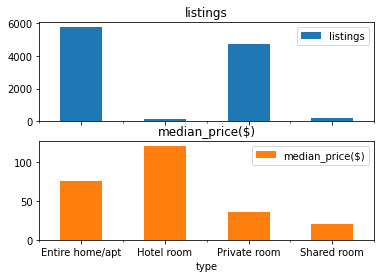

In [12]:
# Bar chart for listing type and median price.
types = pd.DataFrame(data.groupby(['type']).size()) # Create dataframe with listings of the different types
types.rename(columns = {0: 'listings'}, inplace = True) # Rename columns
types['median_price($)'] = data.groupby('type').price.median().values # Add the median price
types.plot.bar(rot = 0, subplots = True)

Fir to get an overview, we create a heatmap of the whole distribution of our selected vlistings across berlin.

In [179]:
from folium import plugins
from folium.plugins import HeatMap
brln_map = folium.Map(location = getCoord('Berlin'), zoom_start = 11)

data_loc = data[['latitude','longitude']].values
HeatMap(data = data_loc.tolist(), radius=10, max_zoom=12).add_to(brln_map)
# brln_map

from folium import plugins

# let's start again with a clean copy of the map of San Francisco
# airbnb_map = folium.Map(location = getCoord('Berlin'), zoom_start = 11)

# instantiate a mark cluster object for the incidents in the dataframe
lists = plugins.MarkerCluster().add_to(brln_map)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(data.latitude, data.longitude, data.neighbourhood):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=label,
    ).add_to(lists)

brln_map

We notice a concerntration of listings in the middle of the city. 

The heatmap doesnt actually clearly show how the listings differ according to the Neighbourhoods (Stadtvierteil) and Districts (Bezirks) in Berlin. For that we use a GeoJson file and foliums chlorpeth plug in.

First we download the GeoJSON file for berlin using Geopandas

In [15]:
# Importing the Berlin districts and quarters boundary GeoJSON file
geo_url = 'http://data.insideairbnb.com/germany/be/berlin/2021-02-20/visualisations/neighbourhoods.geojson'
s=requests.get(url).content
gdf = gpd.read_file(geo_url)
gdf.shape

(140, 3)

Next group the listings according to neighbourhoods, and the using the folium choropleth plugin, we generate maps showing the median price and number of reviews per month for the neighbourhoods

In [14]:
sv = pd.DataFrame(data.groupby(['neighbourhood']).size())
sv.rename(columns={0: 'number_of_listings'}, inplace=True)
sv['median_price'] = data.groupby('neighbourhood').price.median().values
sv['median_reviews'] = data.groupby('neighbourhood').number_of_reviews.median().values
# sv['mean_price'] = data.groupby('neighbourhood').price.mean().values
sv.reset_index(inplace= True)


brlq_map = folium.Map(location = getCoord('Berlin'), zoom_start = 11)
brlq_map.choropleth(
    geo_data='berlin_neighbourhoods.geojson',
    data=sv,
    columns=['neighbourhood', 'number_of_listings'],
    key_on='feature.properties.neighbourhood',
    fill_color='YlOrRd', 
    fill_opacity=0.8, 
    line_opacity=0.3,
    legend_name='Number of Listings'
)


# display map
brlq_map

/usr/local/lib/python3.7/dist-packages/folium/folium.py:426: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


In [14]:
brlq_map = folium.Map(location = getCoord('Berlin'), zoom_start = 11)
brlq_map.choropleth(
    geo_data='berlin_neighbourhoods.geojson',
    data=sv,
    columns=['neighbourhood', 'median_reviews'],
    key_on='feature.properties.neighbourhood',
    fill_color='YlGnBu', 
    fill_opacity=0.8, 
    line_opacity=0.3,
    legend_name='Median number of reviews'
)

# display map
brlq_map

/usr/local/lib/python3.7/dist-packages/folium/folium.py:426: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


The dark patches show regions with listings that to fit our criteria. We also create a map for prices and popularity

In [195]:

brlq_map = folium.Map(location = getCoord('Berlin'), zoom_start = 10)
brlq_map.choropleth(
    geo_data='berlin_neighbourhoods.geojson',
    data=sv,
    columns=['neighbourhood', 'median_price'],
    key_on='feature.properties.neighbourhood',
    fill_color='PuBuGn', 
    fill_opacity=0.8, 
    line_opacity=0.3,
    legend_name='Median prices'
)

# display map
brlq_map

/usr/local/lib/python3.7/dist-packages/folium/folium.py:426: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


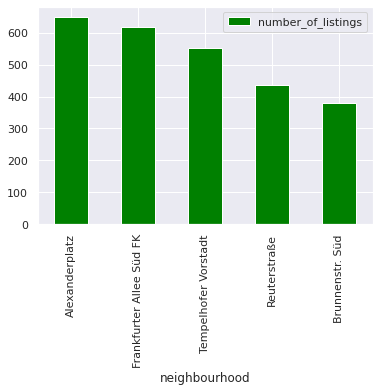

In [208]:
# Nieghbourhoods with the most listings
top5 = sv.sort_values(by='number_of_listings', ascending = False).head()
top5.plot.bar(x = 'neighbourhood', y = 'number_of_listings', color = 'green')

Good thing the areas with the most listings don't have the highest prices for us

## CLUSTERING

For clustering, we are relyinf on a K-Means algorithm which works with numerical data. However, we have some columns with categorical variables such as the listing type and  which has four unique types

In [35]:
# One hot encoding for Categorical features
cat_data = data[['superhost', 'type']] # Select categorical variables 
dummies = pd.get_dummies(cat_data, columns=cat_data.columns) # Create dummies
dummies.head()

,superhost_f,superhost_t,type_Entire home/apt,type_Hotel room,type_Private room,type_Shared room
0,1,0,1,0,0,0
1,1,0,0,0,1,0
2,0,1,1,0,0,0
3,0,1,0,0,1,0
4,1,0,1,0,0,0


Most of the listings are either entire apartments or private rooms.

We apply One hot encoding to the categorical data. This is achieved using the pd.get_dummies() method.



To spread the importance to all continous features, we need to scale them. For this, we use scikit-learn’s MinMaxScaler as the feature matrix is a mix of binary and continuous features.

In [36]:
from sklearn.preprocessing import MinMaxScaler
num_clmns = data.describe().drop(columns = ['id', 'latitude', 'longitude']).columns
num_data = data[num_clmns]
mms = MinMaxScaler()
mms.fit(num_data) # Fit the data
num_data = mms.transform(num_data) #Transform the data
num_data
kdata = pd.DataFrame(num_data, columns=num_clmns )
kdata.insert(loc = 0, column = 'id', value = data['id']) # add the ids df.insert(loc, column, value)

kdata = pd.concat([kdata, dummies], axis=1) # add the encoded categorical data
kdata

,id,accommodates,bedrooms,beds,price,minimum_nights,number_of_reviews,reviews_per_month,review_scores_rating,superhost_f,superhost_t,type_Entire home/apt,type_Hotel room,type_Private room,type_Shared room
0,2015,0.133333,0.000000,0.000000,0.018843,0.166667,0.215559,0.091317,0.9125,1,0,1,0,0,0
1,3309,0.000000,0.000000,0.058824,0.008764,0.500000,0.042139,0.011007,0.8625,1,0,0,0,1,0
2,6883,0.066667,0.000000,0.058824,0.030675,0.500000,0.217180,0.040359,0.9875,0,1,1,0,0,0
3,7071,0.066667,0.000000,0.117647,0.010517,0.000000,0.473258,0.084386,0.9625,0,1,0,0,1,0
4,9991,0.400000,0.272727,0.411765,0.074934,0.416667,0.011345,0.004077,1.0000,1,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10834,47844935,0.200000,0.000000,0.176471,0.008764,0.083333,0.000000,0.039951,1.0000,1,0,1,0,0,0
10835,47896815,0.066667,0.000000,0.058824,0.020158,0.083333,0.000000,0.039951,1.0000,1,0,1,0,0,0
10836,47920604,0.200000,0.090909,0.235294,0.045136,0.083333,0.000000,0.039951,1.0000,1,0,1,0,0,0
10837,47949902,0.066667,0.090909,0.176471,0.013585,0.000000,0.000000,0.039951,0.5000,1,0,0,0,1,0


#### Load venues and convert to One Hot

Now to some serious stuff. We try to get the venues around the Airbnb listings. This requires the powerful Foursquare places API. Here we find venues around a 500m radius of each listing.

Now we have our venues, for it to be useful, it is necessary to apply one hot enconding on the results. The next function takes the data of the venue and returns a data frame with rows of each listing and columns made up of all unique categories and the frequencies in our venues data.

In [21]:
# one hot encoding
def OneHotArBnB(venues):
    AB_onehot = pd.get_dummies(venues[['Venue Category']], prefix="", prefix_sep="")

    # add id column back to dataframe
    AB_onehot['id'] = AB_venues['id'] 

    # move neighborhood column to the first column
    fixed_columns = [AB_onehot.columns[-1]] + list(AB_onehot.columns[:-1])
    AB_onehot = AB_onehot[fixed_columns]

    print('Original Shape: {}'.format(AB_onehot.shape))
    
    AB_grouped = AB_onehot.groupby('id').mean().reset_index()
    print('Grouped Shape: {}'.format(AB_grouped.shape))

    return AB_grouped

In [22]:
AB_grouped = OneHotArBnB(AB_venues)
AB_grouped.head()

Original Shape: (238450, 443)
Grouped Shape: (4993, 443)


,id,ATM,Accessories Store,Adult Boutique,Advertising Agency,Afghan Restaurant,African Restaurant,American Restaurant,Antique Shop,Aquarium,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Austrian Restaurant,Auto Dealership,Auto Garage,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Basketball Court,Bath House,Bathing Area,Bavarian Restaurant,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,...,Thai Restaurant,Theater,Theme Park Ride / Attraction,Theme Restaurant,Thrift / Vintage Store,Tibetan Restaurant,Tour Provider,Tourist Information Center,Toy / Game Store,Track,Track Stadium,Trail,Train Station,Tram Station,Trattoria/Osteria,Tree,Tunnel,Turkish Home Cooking Restaurant,Turkish Restaurant,Vacation Rental,Vegetarian / Vegan Restaurant,Vehicle Inspection Station,Venezuelan Restaurant,Video Store,Vietnamese Restaurant,Volleyball Court,Warehouse Store,Watch Shop,Waterfall,Waterfront,Weight Loss Center,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yemeni Restaurant,Yoga Studio,Zoo,Zoo Exhibit
0,2015,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.030303,0.0,0.075758,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.015152,0.015152,0.000000,...,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.030303,0.060606,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.015152,0.000000,0.0,0.0,0.0,0.015152,0.0,0.0
1,3309,0.0,0.0,0.014706,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.014706,0.000000,0.0,0.0,0.0,0.0,0.014706,0.0,0.0,0.0,0.0,0.0,0.000000,0.029412,0.0,0.014706,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.000000,0.000000,0.000000,...,0.029412,0.000000,0.0,0.0,0.014706,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.029412,0.000000,0.014706,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0
2,6883,0.0,0.0,0.000000,0.0,0.0,0.0,0.013158,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.039474,0.000000,0.0,0.026316,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.000000,0.000000,0.013158,...,0.039474,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.065789,0.0,0.0,0.0,0.013158,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.013158,0.0,0.0,0.0,0.013158,0.0,0.0
3,7071,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.010000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.050000,0.0,0.090000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.01,0.000000,0.000000,0.010000,...,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.0,0.0,0.010000,0.0,0.0,0.0,0.010000,0.000000,0.010000,0.0,0.0,0.0,0.050000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.020000,0.000000,0.0,0.0,0.0,0.010000,0.0,0.0
4,9991,0.0,0.0,0.000000,0.0,0.0,0.0,0.014085,0.0,0.0,0.0,0.0,0.000000,0.014085,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.028169,0.0,0.084507,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.014085,0.000000,0.014085,...,0.000000,0.014085,0.0,0.0,0.000000,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.014085,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.042254,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.014085,0.0,0.0,0.0,0.000000,0.0,0.0


Then, we combine the listing data and the nearby venues.

In [37]:
AB_grouped_clustering = AB_grouped.merge(kdata, left_on='id', right_on='id')
AB_grouped_clustering

,id,ATM,Accessories Store,Adult Boutique,Advertising Agency,Afghan Restaurant,African Restaurant,American Restaurant,Antique Shop,Aquarium,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Austrian Restaurant,Auto Dealership,Auto Garage,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Basketball Court,Bath House,Bathing Area,Bavarian Restaurant,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,...,Trattoria/Osteria,Tree,Tunnel,Turkish Home Cooking Restaurant,Turkish Restaurant,Vacation Rental,Vegetarian / Vegan Restaurant,Vehicle Inspection Station,Venezuelan Restaurant,Video Store,Vietnamese Restaurant,Volleyball Court,Warehouse Store,Watch Shop,Waterfall,Waterfront,Weight Loss Center,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yemeni Restaurant,Yoga Studio,Zoo,Zoo Exhibit,accommodates,bedrooms,beds,price,minimum_nights,number_of_reviews,reviews_per_month,review_scores_rating,superhost_f,superhost_t,type_Entire home/apt,type_Hotel room,type_Private room,type_Shared room
0,2015,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.030303,0.000000,0.075758,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.015152,0.015152,0.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.030303,0.060606,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.015152,0.000000,0.0,0.0,0.000000,0.015152,0.0,0.0,0.133333,0.000000,0.000000,0.018843,0.166667,0.215559,0.091317,0.9125,1,0,1,0,0,0
1,3309,0.0,0.0,0.014706,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.014706,0.000000,0.0,0.0,0.000000,0.0,0.014706,0.0,0.0,0.0,0.0,0.0,0.000000,0.029412,0.000000,0.014706,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.029412,0.000000,0.014706,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.058824,0.008764,0.500000,0.042139,0.011007,0.8625,1,0,0,0,1,0
2,6883,0.0,0.0,0.000000,0.0,0.0,0.0,0.013158,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.039474,0.000000,0.000000,0.026316,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.000000,0.000000,0.013158,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.065789,0.0,0.0,0.0,0.013158,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.013158,0.0,0.0,0.000000,0.013158,0.0,0.0,0.066667,0.000000,0.058824,0.030675,0.500000,0.217180,0.040359,0.9875,0,1,1,0,0,0
3,7071,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.010000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.050000,0.000000,0.090000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.01,0.000000,0.000000,0.010000,...,0.010000,0.0,0.0,0.0,0.010000,0.000000,0.010000,0.0,0.0,0.0,0.050000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.020000,0.000000,0.0,0.0,0.000000,0.010000,0.0,0.0,0.066667,0.000000,0.117647,0.010517,0.000000,0.473258,0.084386,0.9625,0,1,0,0,1,0
4,9991,0.0,0.0,0.000000,0.0,0.0,0.0,0.014085,0.0,0.0,0.0,0.0,0.000000,0.014085,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.028169,0.000000,0.084507,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.014085,0.000000,0.014085,...,0.014085,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.042254,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.014085,0.0,0.0,0.000000,0.000000,0.0,0.0,0.400000,0.272727,0.411765,0.074934,0.416667,0.011345,0.004077,1.0000,1,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4988,23259358,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.100000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0

The N most common venues are then around each listing is then extracted in order to get an overview of the surroundings of each listing.

In [24]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [27]:
def CommonVenues(df):
    None
    indicators = ['st', 'nd', 'rd']
    # create columns according to number of top venues
    columns = df.columns[0]
    columns = [df.columns[0]]
    
    for ind in np.arange(num_top_venues):
        try:
            columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
        except:
            columns.append('{}th Most Common Venue'.format(ind+1))
            
    # create a new dataframe
    subs_venues_sorted = pd.DataFrame(columns=columns)
    subs_venues_sorted[subs_venues_sorted.columns[0]] = df[df.columns[0]]

    for ind in np.arange(df.shape[0]):
        subs_venues_sorted.iloc[ind, 1:] = return_most_common_venues(df.iloc[ind, :], num_top_venues)
    return subs_venues_sorted

In [29]:
num_top_venues = 10
AB_venues_sorted = CommonVenues(df = AB_grouped)
AB_venues_sorted

,id,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,2015,Bar,Vegetarian / Vegan Restaurant,Café,Coffee Shop,Italian Restaurant,Park,Vacation Rental,Boutique,Bakery,Pizza Place
1,3309,Café,Cocktail Bar,Coffee Shop,Gay Bar,Men's Store,Hotel,Falafel Restaurant,Indian Restaurant,Organic Grocery,Supermarket
2,6883,Café,Vegetarian / Vegan Restaurant,Coffee Shop,Middle Eastern Restaurant,Thai Restaurant,Italian Restaurant,Plaza,Falafel Restaurant,Bagel Shop,Pizza Place
3,7071,Café,Bar,Vietnamese Restaurant,Bakery,Pizza Place,Ice Cream Shop,Falafel Restaurant,Seafood Restaurant,Doner Restaurant,Pastry Shop
4,9991,Bar,Coffee Shop,Playground,Hotel,Vietnamese Restaurant,Cocktail Bar,French Restaurant,Historic Site,Supermarket,Bakery
...,...,...,...,...,...,...,...,...,...,...,...
4988,23259358,Café,Bakery,Supermarket,Organic Grocery,Beer Garden,Drugstore,Filipino Restaurant,Trattoria/Osteria,Soup Place,Mediterranean Restaurant
4989,23259976,Café,German Restaurant,Plaza,Bakery,Italian Restaurant,Vietnamese Restaurant,Dim Sum Restaurant,Metro Station,Trattoria/Osteria,Supermarket
4990,23263156,Café,Bar,Plaza,Breakfast Spot,Middle Eastern Restaurant,Ice Cream Shop,Park,Cocktail Bar,Grocery Store,Eastern European Restaurant
4991,23264117,Supermarket,Italian Restaurant,Platform,Hotel,Asian Restaurant,Hookah Bar,Vietnamese Restaurant,Bakery,Boat or Ferry,Laser Tag


### K-Means Clustering

Now we attempt to create clusters of listings based on the venues and the numerical and categorical characteristics of the listings.

First we use the elbow method to find the optimum number of clusters.

The elbow method is one of the simplest methods for defining the number of clusters in K-Means clustering. It involves selecting the point where the slope of the curve decreases significantly.

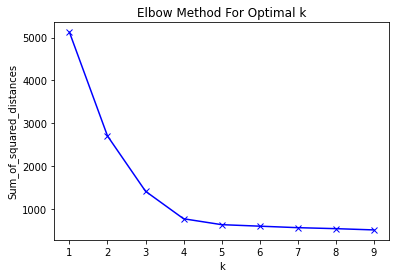

In [38]:
Sum_of_squared_distances = []
K = range(1,10)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(AB_grouped_clustering.drop('id', 1))
    Sum_of_squared_distances.append(km.inertia_)

plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()



Results of the elbow chart suggest a classifying the data into 4 clusters.

In [48]:
# set number of clusters

k = 4
# Drop listing id
# AB_grouped_clustering = AB_grouped.merge(df_onehot, left_on='listing_id', right_on='id').drop(['id','listing_id'], 1)
# AB_grouped_clustering = AB_grouped.drop('listing_id', 1)
 
# run k-means clustering
kmeans = KMeans(n_clusters=k, random_state=0).fit(AB_grouped_clustering.drop('id', 1))
# db = DBSCAN().fit(AB_grouped_clustering)
 
# check cluster labels generated for each row in the dataframe
print('Cluster labels: {}'.format(kmeans.labels_[0:150]))
# print('Cluster labels: {}'.format(db.labels_))
 

try:
  AB_venues_sorted.drop(columns = 'Cluster Labels', inplace= True)
  AB_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

except:
  AB_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

    
AB_merged = data
 
# # merge AB_grouped with AB_data to add latitude/longitude for each neighborhood
AB_merged = AB_merged.join(AB_venues_sorted.set_index('id'), on='id')
 
print(AB_merged.shape)
 
# # Drop NaN and convert cluster to int
AB_merged = AB_merged.dropna(axis = 0).reset_index(drop=True)
AB_merged['Cluster Labels']= AB_merged['Cluster Labels'].astype(int)
 
AB_merged.to_csv('{}_Clustered_AIRBNB_{}.csv'.format(k, city ))
 
print(AB_merged.shape)

Cluster labels: [1 2 0 3 1 1 1 1 0 1 3 2 2 2 2 0 2 1 3 0 1 0 1 3 1 2 0 2 1 1 0 1 0 1 0 1 0
 1 3 0 0 1 1 0 1 1 3 1 2 0 1 3 1 3 1 1 2 2 1 0 0 2 1 0 1 0 0 2 1 0 1 2 1 0
 1 1 0 3 1 1 2 0 1 2 0 2 3 2 0 2 3 1 1 3 0 1 0 0 3 3 0 1 0 0 0 1 1 1 1 0 2
 2 2 0 3 2 0 1 0 0 0 2 2 2 2 2 2 1 1 1 0 3 0 1 0 2 0 2 2 2 2 2 2 1 2 0 1 1
 1 1]
(10839, 28)
(4993, 28)


Looking into the clusers, we see that the listings have been grouped into cheaper possibly single rooms and more expensive entire apartments. This becomes useful in detecting the best listings based on the user's choices

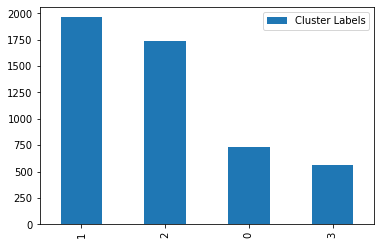

In [53]:
pd.DataFrame(AB_merged['Cluster Labels'].value_counts()).plot.bar()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """Entry point for launching an IPython kernel.


array([<matplotlib.axes._subplots.AxesSubplot object at 0x7ff197a47790>,
      dtype=object)

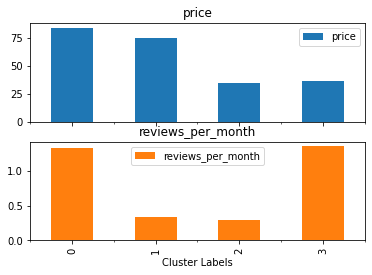

In [73]:
agg_list= AB_merged.groupby(['Cluster Labels'])['price', 'reviews_per_month'].median()
agg_list.plot.bar(subplots = True)

Now we put this to a test. Imagine a user wants to search for listings in berlin, but would like to be within 500m distance of a Museum, a Bar and a Supermarket. 

We pass these as Inputs and then get a map of the listings available that suit these criteria.

In [87]:
cat_list = [ 'Park', 'Bar', 'Supermarket', 'Gym']
selcted = AB_merged.iloc[:, 18:28]

for cat in cat_list:
  selcted = selcted[selcted.apply(lambda r: r.str.contains(cat, case=False).any(), axis=1)]
best = AB_merged.iloc[selcted.index]
best

,id,superhost,neighbourhood,district,latitude,longitude,type,accommodates,bedrooms,beds,price,minimum_nights,last_review,number_of_reviews,reviews_per_month,review_scores_rating,instant_bookable,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
413,1044626,f,Rixdorf,Neukölln,52.47810,13.44560,Private room,2,1,1,26,2,2019-02-11,16,0.17,93,f,2,Café,Bar,Coffee Shop,Burger Joint,Indian Restaurant,Supermarket,Cocktail Bar,Park,Latin American Restaurant,Climbing Gym
531,1521826,t,Rixdorf,Neukölln,52.47842,13.44671,Private room,2,1,1,48,3,2019-10-14,53,1.14,98,f,3,Café,Bar,Supermarket,Indian Restaurant,Pool,Park,Latin American Restaurant,Climbing Gym,Chinese Restaurant,Eastern European Restaurant
639,2047139,f,Schöneberg-Süd,Tempelhof - Schöneberg,52.48233,13.36147,Private room,2,1,1,29,8,2018-09-27,136,1.55,92,f,2,Café,Park,Bistro,Italian Restaurant,Gym / Fitness Center,Bakery,Coffee Shop,Cocktail Bar,Supermarket,Climbing Gym
992,3974304,t,Schöneberg-Süd,Tempelhof - Schöneberg,52.48246,13.36200,Entire home/apt,4,1,2,80,3,2020-12-19,285,3.93,98,t,0,Café,Park,Bistro,Italian Restaurant,Gym / Fitness Center,Bakery,Coffee Shop,Cocktail Bar,Supermarket,Climbing Gym
1044,4202157,f,südliche Luisenstadt,Friedrichshain-Kreuzberg,52.49272,13.43451,Private room,2,1,1,49,3,2020-01-03,35,0.46,94,f,2,Coffee Shop,Bar,Supermarket,Café,Waterfront,Park,Snack Place,Climbing Gym,Rock Club,Rest Area
1631,7787192,f,Schöneberg-Süd,Tempelhof - Schöneberg,52.48222,13.36086,Entire home/apt,3,1,3,90,7,2018-06-30,7,0.12,97,f,1,Café,Park,Bistro,Gym / Fitness Center,Italian Restaurant,Bakery,Coffee Shop,Cocktail Bar,Supermarket,Climbing Gym
1651,7872193,f,Tempelhofer Vorstadt,Friedrichshain-Kreuzberg,52.48842,13.37656,Private room,2,1,1,120,2,2020-07-27,144,2.16,98,f,2,Italian Restaurant,Supermarket,Playground,Café,Bar,Park,Light Rail Station,Gym,Scenic Lookout,Basketball Court
1723,8253838,f,Schöneberg-Süd,Tempelhof - Schöneberg,52.48507,13.36675,Entire home/apt,5,3,3,140,3,2018-08-20,8,0.12,100,t,1,Café,Park,Italian Restaurant,Bar,Pool Hall,Supermarket,Grocery Store,German Restaurant,Gym / Fitness Center,Bistro
2473,13583119,t,Rixdorf,Neukölln,52.47892,13.44723,Private room,2,1,1,38,3,2020-09-06,22,0.39,99,t,3,Café,Supermarket,Bar,Pool,Thai Restaurant,Park,Eastern European Restaurant,Chinese Restaurant,Climbing Gym,Latin American Restaurant
2613,14311547,t,südliche Luisenstadt,Friedrichshain-Kreuzberg,52.49216,13.43377,Private room,2,1,0,21,3,2020-12-07,64,1.16,98,f,3,Coffee Shop,Supermarket,Café,Waterfront,Bar,Park,Snack Place,Climbing Gym,Rest Area,Men's Store


Just five listings. Now we can view them on the map.

#### MApS

In [67]:
# create map
def ClusterMap(df, add, zoom_start, area):
    k = len(set(df['Cluster Labels'].tolist()))
    lati, longi = getCoord(add)
    map_ = folium.Map(location=getCoord(add), zoom_start=zoom_start)
#     map_ = folium.Map(location=[latitude, longitude], zoom_start=10)

# set color scheme for the clusters
    x = np.arange(k)
    ys = [i + x + (i*x)**2 for i in range(k)]
    colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
    rainbow = [colors.rgb2hex(i) for i in colors_array]

    # add markers to the map
    markers_colors = []
    for lat, lon, poi, price, cluster in zip(df['latitude'], df['longitude'], df[area],  df['price'].astype(int),  df['Cluster Labels'].astype(int)):
        label = folium.Popup(str(poi) + ' : Cluster ' + str(cluster) , parse_html=True)
        # label = folium.Popup(str(poi)  + 'n\ Price ' + str(price), parse_html=True)
        folium.CircleMarker(
            [lat, lon],
            radius=5,
            popup=label,
            color=rainbow[cluster-1],
            fill=True,
            fill_color=rainbow[cluster-1],
            fill_opacity=0.7).add_to(map_)

#     lists = plugins.MarkerCluster().add_to(map_)

# # loop through the dataframe and add each data point to the mark cluster
#     for lat, lng in zip(df.latitude, df.longitude):
#         folium.Marker(
#             location=[lat, lng],
#             icon=None,
#         ).add_to(lists)

    return map_

In [84]:
mapa = ClusterMap(df = best, add = 'Berlin', zoom_start = 11, area = 'neighbourhood')
mapa

In [85]:
best.shape

(16, 28)

Accordingly, we find that two out of the five listings can sbe convinient on a budget. Personally I would be more interested with that at the city center (Regierungsviertel).

## Conclusion

We have been able to create a program that loops through Airbnb listings in berlin, group them into two clusters and then narrow the search based on nearby venues. 

There's still quite a lot of room for further development including trying out other cluster algorithms and incorparating additional data (like events nearby etc.)